# 教科書と違うコードになっているので気をつけてください

In [ ]:
# Google Driveと接続を行います。これを行うことで、Driveにあるデータにアクセスできるようになります。
# 下記セルを実行すると、Googleアカウントのログインを求められますのでログインしてください。
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


## YOLOの準備

In [ ]:
import os

# 作業ディレクトリ設定
base_dir = '/content/drive/MyDrive/11章'
os.chdir(base_dir)

# 11章フォルダに、yolov5をクローン
!git clone https://github.com/ultralytics/yolov5.git

# yolov5フォルダに移動
%cd yolov5

# 依存パッケージをインストール
!pip install -r requirements.txt

Cloning into 'yolov5'...
remote: Enumerating objects: 17488, done.
remote: Counting objects: 100% (2/2), done.
remote: Compressing objects: 100% (2/2), done.
remote: Total 17488 (delta 0), reused 0 (delta 0), pack-reused 17486 (from 2)
Receiving objects: 100% (17488/17488), 16.54 MiB | 13.38 MiB/s, done.
Resolving deltas: 100% (11988/11988), done.
/content/drive/MyDrive/11章/yolov5
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 363.4/363.4 MB 3.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.8/13.8 MB 116.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 24.6/24.6 MB 90.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 883.7/883.7 kB 59.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 664.8/664.8 MB 2.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 211.5/211.5 MB 5.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.3/56.3 MB 15.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 127.9/127.9 M

## 物体推定に使う画像(img01.jpg)を表示

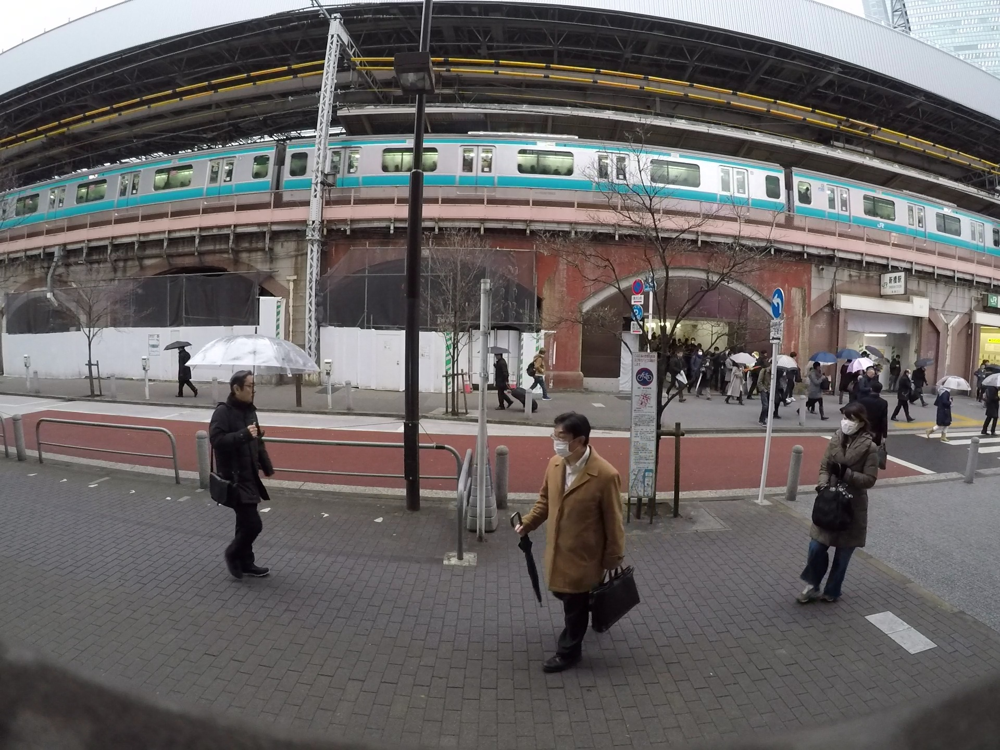

In [ ]:
from PIL import Image
from IPython.display import display

# 画像パス
image_path = os.path.join(base_dir, 'img/img01.jpg')

# 画像表示
display(Image.open(image_path))

## 画像を推論

Creating new Ultralytics Settings v0.0.6 file ✅ 
View Ultralytics Settings with 'yolo settings' or at '/root/.config/Ultralytics/settings.json'
Update Settings with 'yolo settings key=value', i.e. 'yolo settings runs_dir=path/to/dir'. For help see https://docs.ultralytics.com/quickstart/#ultralytics-settings.
detect: weights=['yolov5s.pt'], source=/content/drive/MyDrive/11章/img/img01.jpg, data=data/coco128.yaml, imgsz=[640, 640], conf_thres=0.25, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=False, save_format=0, save_csv=False, save_conf=False, save_crop=False, nosave=False, classes=[0], agnostic_nms=False, augment=False, visualize=False, update=False, project=/content/drive/MyDrive/11章/img, name=exp, exist_ok=True, line_thickness=3, hide_labels=False, hide_conf=False, half=False, dnn=False, vid_stride=1
YOLOv5 🚀 v7.0-420-g0c99ce80 Python-3.11.13 torch-2.6.0+cu124 CUDA:0 (Tesla T4, 15095MiB)

100% 14.1M/14.1M [00:00<00:00, 159MB/s]

Fusing layers... 
YOLOv5s summary:

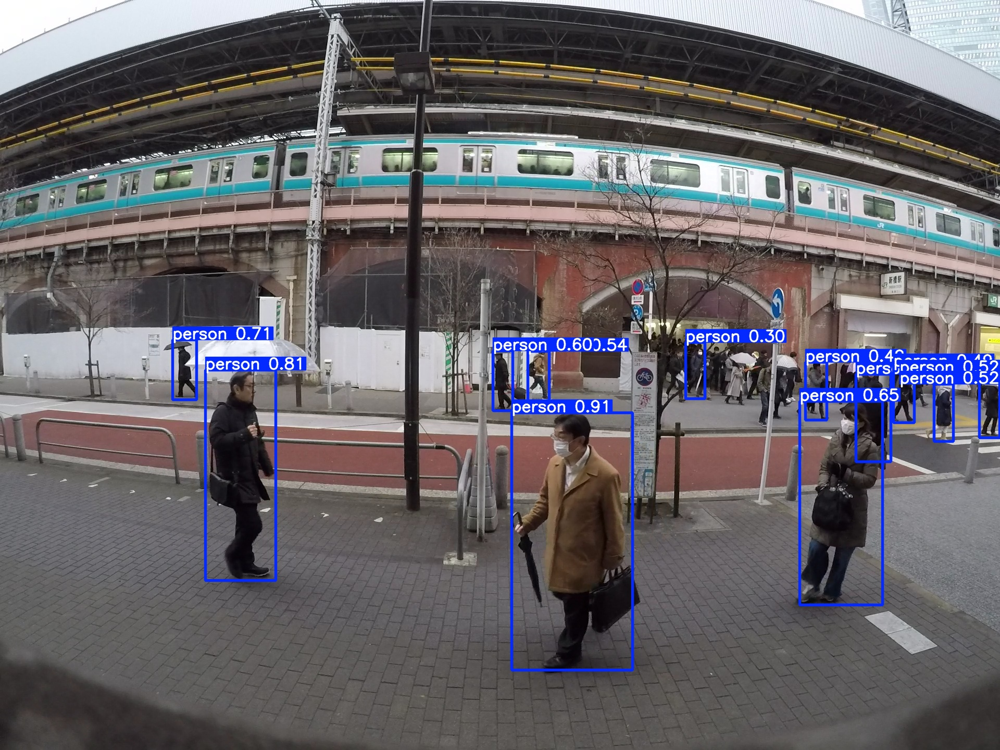

In [ ]:
# 推論結果の保存先
result_dir = os.path.join(base_dir, 'img')

# YOLOv5の推論を実行
# yolov5s.ptを使い、画像サイズ640、信頼度0.25以上で人（クラス0）だけを検出し、image_pathの画像に対して推論、結果はresult_dirに保存
!python detect.py --weights yolov5s.pt --img 640 --conf 0.25 --source {image_path} \
--project {result_dir} --exist-ok --classes 0

# 推論結果画像のパスを作成
# YOLOv5は自動でresult_dirの下に「exp」フォルダを作って保存するため、「exp」フォルダをパスに含める必要がある
result_img_path = os.path.join(result_dir, 'exp', os.path.basename(image_path))

# 結果画像を読み込み、表示
img = Image.open(result_img_path)
display(img)

## HOGによる人の検出

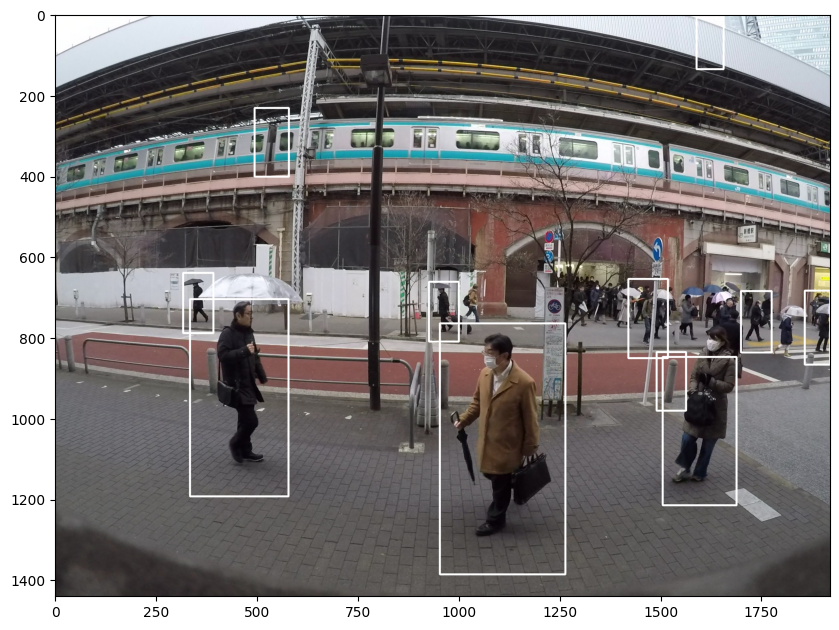

In [ ]:
import cv2
import matplotlib.pyplot as plt

# HOG特徴量検出器の準備
hog = cv2.HOGDescriptor()
hog.setSVMDetector(cv2.HOGDescriptor_getDefaultPeopleDetector())  # 人検出用のデフォルトSVMをセット

hogParams = {  # 検出パラメータの設定
    'winStride': (8, 8),    # スライドウィンドウの移動ステップ
    'padding': (32, 32),    # パディング
    'scale': 1.05,          # 画像ピラミッドの縮小率
    'hitThreshold': 0,      # 閾値
    'groupThreshold': 5     # 重複矩形をまとめる際の閾値
}

# 画像読み込みとグレースケール変換
img_hog = cv2.imread(image_path)
gray = cv2.cvtColor(img_hog, cv2.COLOR_BGR2GRAY)

# 人物検出
human, r = hog.detectMultiScale(gray, **hogParams)

# 検出した人物の周囲に白色の矩形を描画
if len(human) > 0:
    for (x, y, w, h) in human:
        cv2.rectangle(img_hog, (x, y), (x + w, y + h), (255, 255, 255), 3)

# 表示用にBGRからRGBに変換
img_hog = cv2.cvtColor(img_hog, cv2.COLOR_BGR2RGB)

# 画像を表示
plt.figure(figsize=(10, 10))
plt.imshow(img_hog)

## 結果の比較

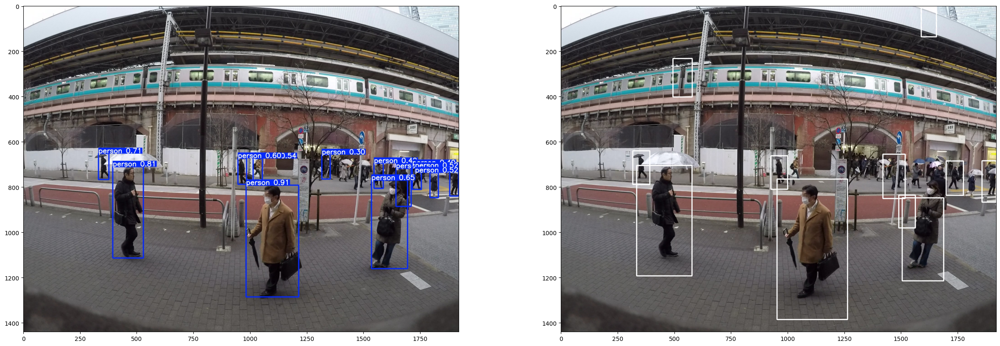

In [ ]:
plt.figure(figsize=(30,10))  # 描画領域のサイズを指定（横長の大きめサイズ）

plt.subplot(1, 2, 1)         # プロット領域を作成
plt.imshow(img)              # imgを表示

plt.subplot(1, 2, 2)         # プロット領域を作成
plt.imshow(img_hog)          # img_hogを表示

## おまけ 車・バス・トラックの検出

In [ ]:
import glob

# COCOデータセットで車に該当するクラスIDのリスト
car_classes = [2, 5, 7]  # 2: car, 5: bus, 7: truck

def detect_cars_only(image_path, conf_threshold=0.25):
    # クラスIDを文字列に変換し、スペース区切りで連結（detect.pyに渡す形式）
    class_ids_str = " ".join(map(str, car_classes))

    # detect.pyをコマンド実行して車関連クラスだけ検出
    # image_pathには絶対パスを指定している想定
    os.system(f"python detect.py --weights yolov5s.pt --img 640 --conf {conf_threshold} --source {image_path} --classes {class_ids_str}")

    # 推論結果が保存されるruns/detect/exp*フォルダの中で一番新しいものを取得
    exp_dirs = sorted(glob.glob('runs/detect/exp*'), key=os.path.getmtime)
    latest_exp = exp_dirs[-1]

    # 推論結果画像のパス（元画像名と同じファイル名）
    result_img_path = os.path.join(latest_exp, os.path.basename(image_path))

    # 画像を読み込み、表示
    img = Image.open(result_img_path)
    display(img)

    # 推論結果画像のパスを返す
    return result_img_path

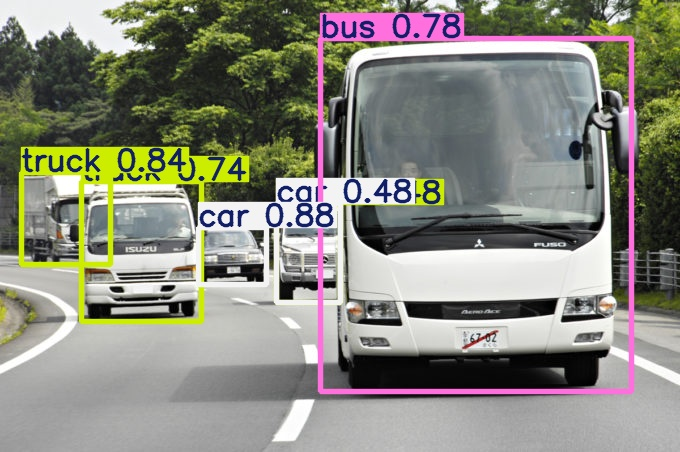

In [ ]:
# 画像の絶対パスを設定（base_dir は事前に定義されている想定）
car_path = os.path.join(base_dir, 'img/car.jpg')

# 車検出関数を呼び出して推論実行＆結果表示
result_path = detect_cars_only(car_path)

# 演習課題：YOLOv5で動画の物体検出に挑戦しよう

### 使用するモデル
YOLOv5（yolov5s.pt）
### 対象の動画ファイル
- 11章/mov/mov01.mp4  
- または 11章/mov/mov02.mp4

### 正解の目安
- 駅近くで人々が歩く動画に「Person」や「umbrella」などのラベルが表示された推論結果動画が生成されていれば成功です。  